In [ ]:
!pip install scikit-learn

In [58]:
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
import seaborn as sns
from ucimlrepo import fetch_ucirepo 

In [3]:
# fetch dataset 
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17) 

In [14]:
# data (as pandas dataframes) 
X = breast_cancer_wisconsin_diagnostic.data.features 
y = breast_cancer_wisconsin_diagnostic.data.targets

In [4]:
# metadata 
print(breast_cancer_wisconsin_diagnostic.metadata) 

{'uci_id': 17, 'name': 'Breast Cancer Wisconsin (Diagnostic)', 'repository_url': 'https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic', 'data_url': 'https://archive.ics.uci.edu/static/public/17/data.csv', 'abstract': 'Diagnostic Wisconsin Breast Cancer Database.', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 569, 'num_features': 30, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Diagnosis'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1993, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C5DW2B', 'creators': ['William Wolberg', 'Olvi Mangasarian', 'Nick Street', 'W. Street'], 'intro_paper': {'title': 'Nuclear feature extraction for breast tumor diagnosis', 'authors': 'W. Street, W. Wolberg, O. Mangasarian', 'published_in': 'Electronic imaging', 'year': 1993, 'url': 'https://www.semanticscholar.org/paper/53

In [15]:
# variable information 
print(breast_cancer_wisconsin_diagnostic.variables) 

                  name     role         type demographic description units  \
0                   ID       ID  Categorical        None        None  None   
1            Diagnosis   Target  Categorical        None        None  None   
2              radius1  Feature   Continuous        None        None  None   
3             texture1  Feature   Continuous        None        None  None   
4           perimeter1  Feature   Continuous        None        None  None   
5                area1  Feature   Continuous        None        None  None   
6          smoothness1  Feature   Continuous        None        None  None   
7         compactness1  Feature   Continuous        None        None  None   
8           concavity1  Feature   Continuous        None        None  None   
9      concave_points1  Feature   Continuous        None        None  None   
10           symmetry1  Feature   Continuous        None        None  None   
11  fractal_dimension1  Feature   Continuous        None        

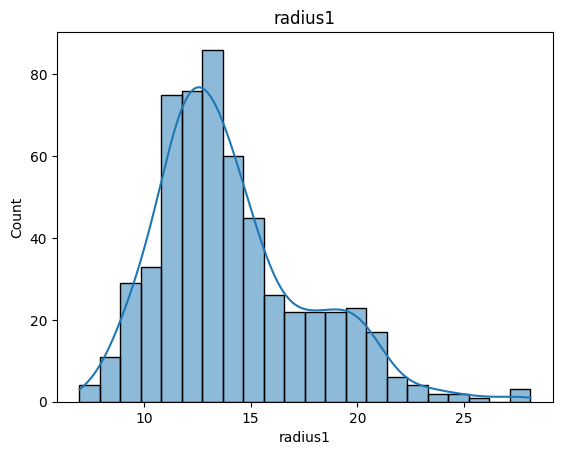

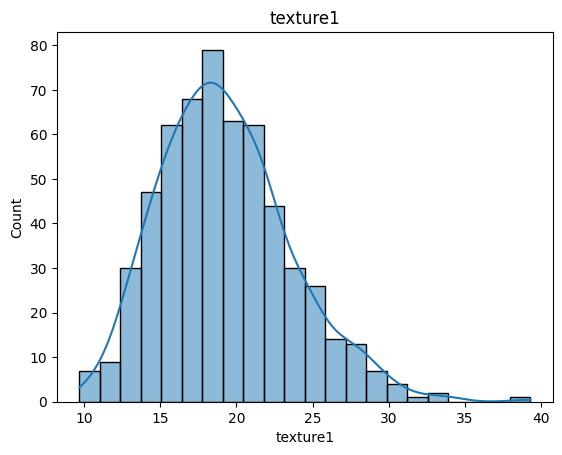

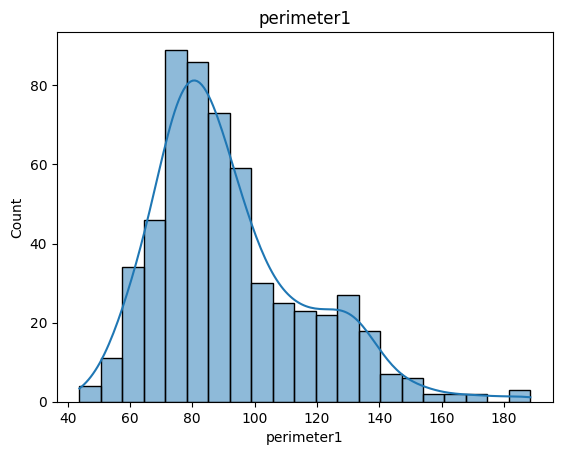

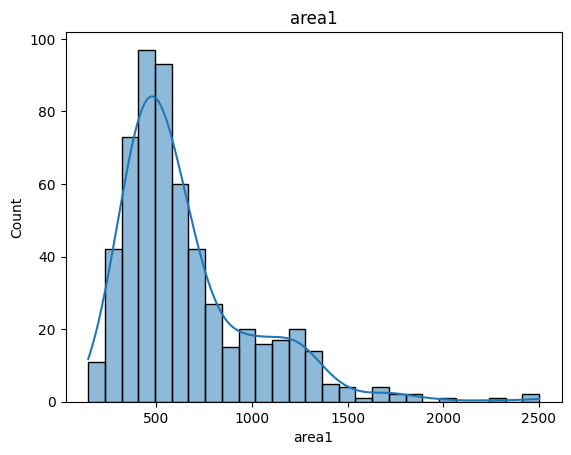

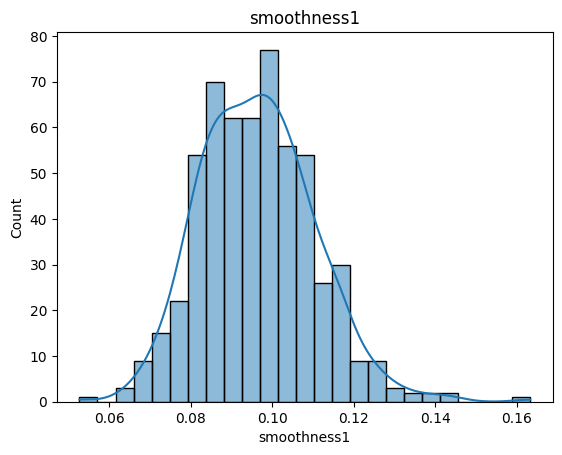

...

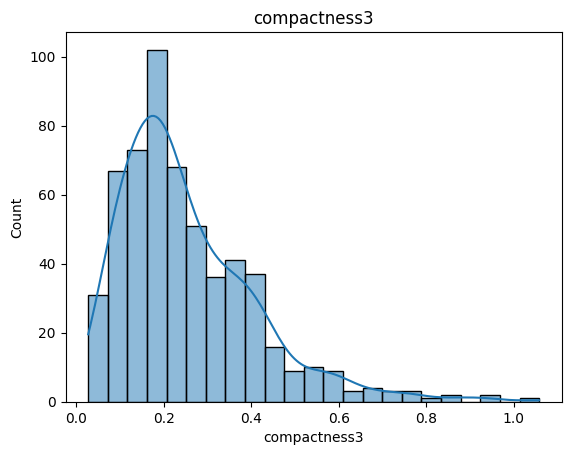

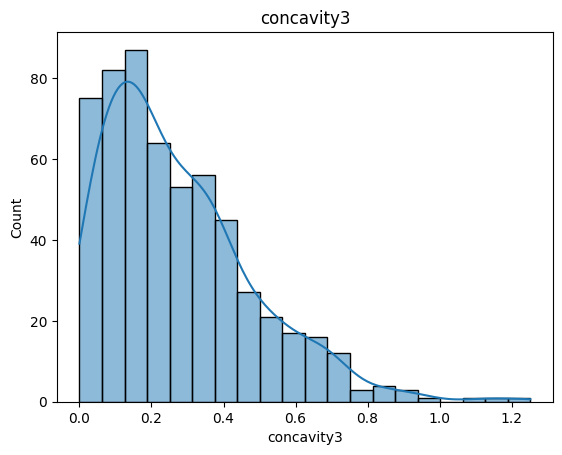

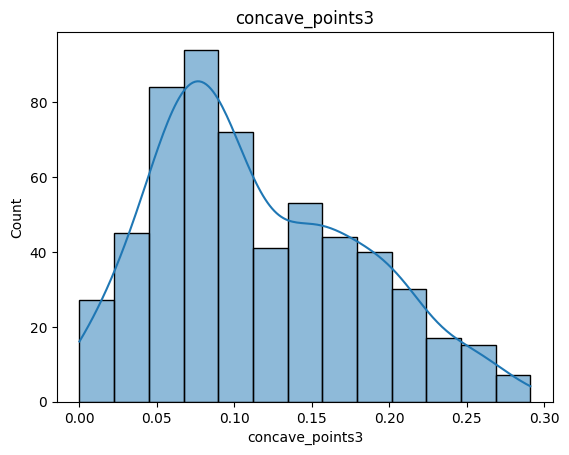

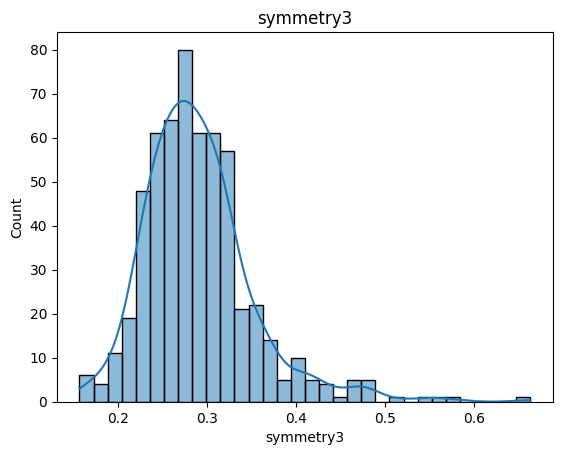

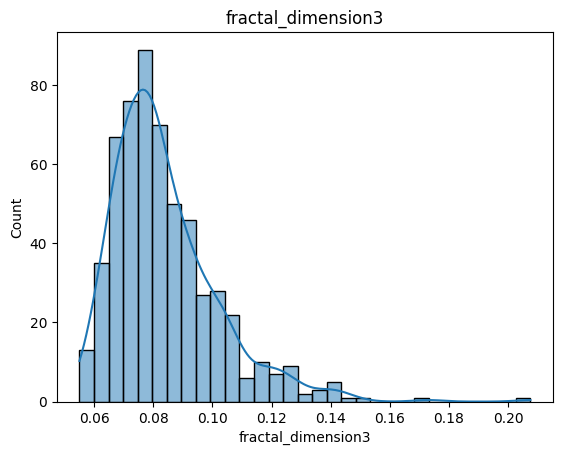

In [6]:

for column in X.columns:
    sns.histplot(X[column], kde=True)
    plt.title(column)
    plt.show()

In [8]:
# RELAÇÕES ENTRE VARIÁVEIS

In [5]:
sns.pairplot(X)
plt.show()

In [ ]:
# CORRELAÇÕES ENTRE VARIÁVEIS 

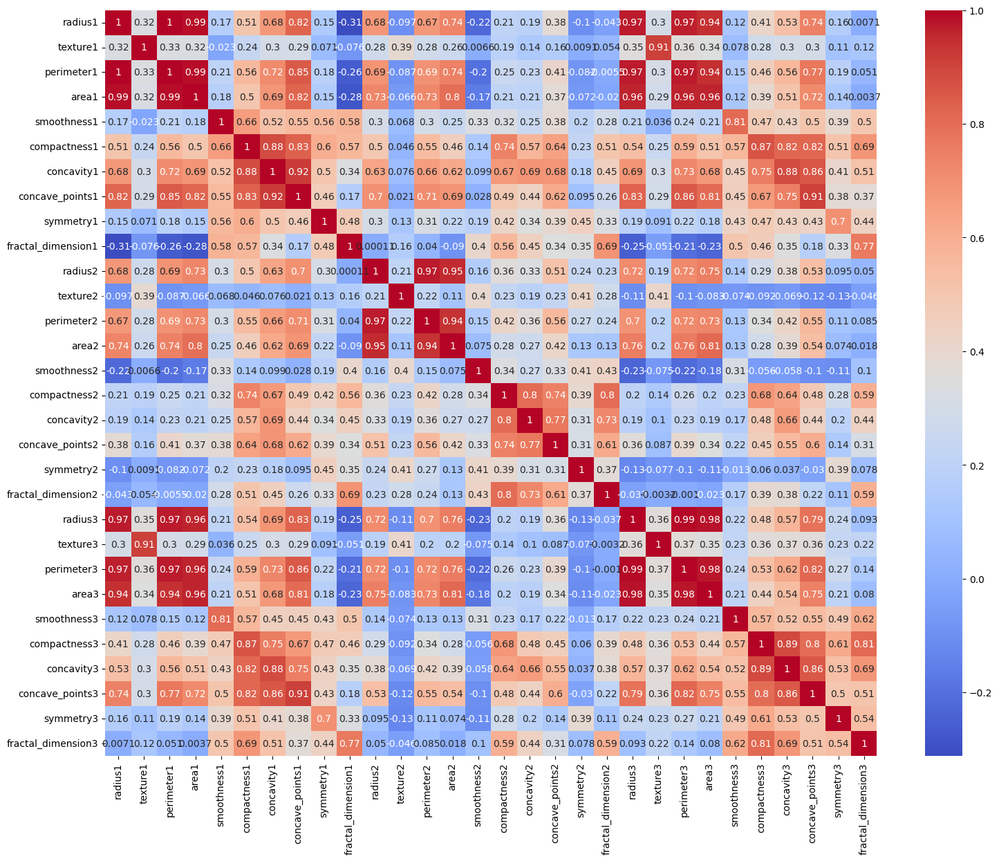

In [12]:
corr = X.corr()
plt.figure(figsize=(18, 14))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

In [ ]:
#  CONTAGEM DIAGNÓSTICO BENIGNOS X MALIGNOS

In [30]:
y.describe()

,Diagnosis
count,569
unique,2
top,B
freq,357


In [43]:
unique_values = y['Diagnosis'].unique()
#count_diagnosis = y['Diagnosis'].value_counts()

In [35]:
print("Valores únicos nos diagnósticos:", unique_values)

Valores únicos nos diagnósticos: ['M' 'B']


In [36]:
count = y['Diagnosis'].value_counts()

In [37]:
print("Contagem de cada diagnóstico:\n", count)

Contagem de cada diagnóstico:
 Diagnosis
B    357
M    212
Name: count, dtype: int64


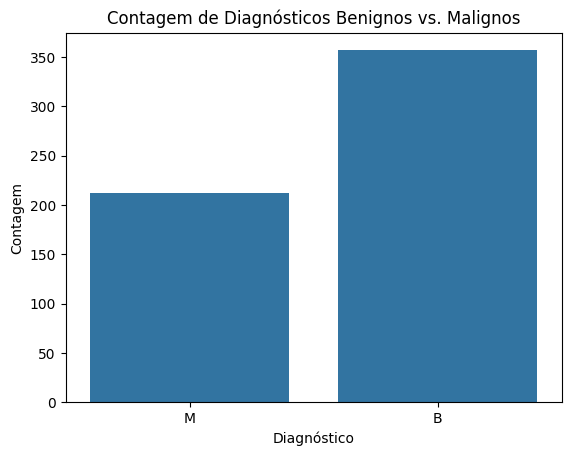

In [38]:
sns.countplot(x= 'Diagnosis', data=y)
plt.title('Contagem de Diagnósticos Benignos vs. Malignos')
plt.xlabel('Diagnóstico')
plt.ylabel('Contagem')
plt.show()

In [44]:
# VIZUALIZAÇÃO COM GRÁFICOS DINÂMICOS UTILIZANDO PLOTLY

In [48]:
from sklearn.decomposition import PCA 

In [51]:
# Inicializar e configurar o PCA
pca = PCA(n_components=2)

In [50]:
# Ajuste e transformação dos dados
X_pca = pca.fit_transform(X)

In [56]:
# Criar um DataFrame para o Plotly
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['Diagnosis'] = y

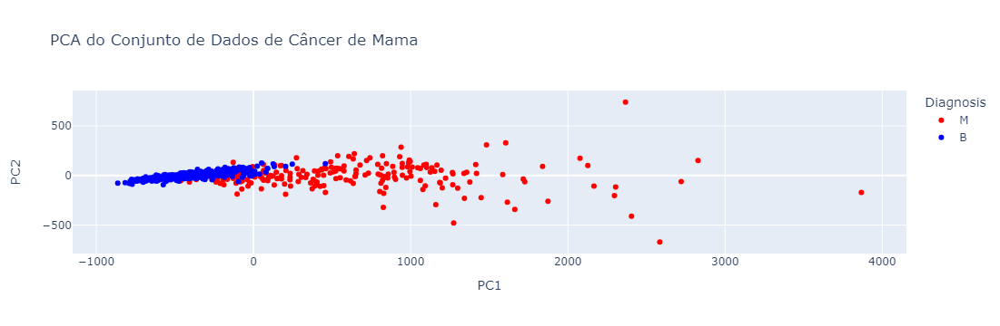

In [62]:
fig = px.scatter(df_pca, x='PC1', y='PC2', color='Diagnosis',
                 color_discrete_map={'M': 'red', 'B': 'blue'},
                 title='PCA do Conjunto de Dados de Câncer de Mama')
fig.show()